https://colab.research.google.com/drive/1fTBX7-fI6pyLPk3mMNdhP5gUcMeaef3f?authuser=1#scrollTo=1uzd4DpDG--J

https://colab.research.google.com/drive/1U513UUXfRY5o2ZXs82kgFaG6lZhdUbji?authuser=1#scrollTo=0-z_WkeNzz5s

https://chatgpt.com/share/68336d34-11e4-8011-b2bf-9928639d3cb2

### FUNCOES DE APOIO

In [40]:
# pip install geopandas matplotlib

#### Distribuicao dos dados

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

def plot_distribuicao_faixa_etaria(df, coluna):
    plt.figure(figsize=(15, 6))
    coluna_foco = coluna

    if coluna == 'Idade':
        def classificar_idade(idade):
            if idade <= 11:
                return 'Infância <= 11'
            elif idade <= 17:
                return 'Adolescência 12 - 17'
            elif idade <= 29:
                return 'Adulto jovem 18 - 29'
            elif idade <= 59:
                return 'Adulto 30 - 59'
            else:
                return 'Idoso >= 60'

        coluna_foco = 'Faixa Etária'
        df[coluna_foco] = df[coluna].apply(classificar_idade)
        ordem_faixas = ['Infância <= 11', 'Adolescência 12 - 17',
                        'Adulto jovem 18 - 29', 'Adulto 30 - 59', 'Idoso >= 60']
        contagem = df[coluna_foco].value_counts().reindex(ordem_faixas)
        porcentagem = df[coluna_foco].value_counts(normalize=True).reindex(ordem_faixas) * 100
    else:
        contagem = df[coluna_foco].value_counts()
        porcentagem = df[coluna_foco].value_counts(normalize=True) * 100

    # Preparar DataFrame para plotagem
    df_plot = porcentagem.reset_index()
    df_plot.columns = [coluna_foco, 'Porcentagem']
    contagem = contagem.values

    # Gráfico de barras
    sns.barplot(x=coluna_foco, y='Porcentagem', data=df_plot, color='skyblue')

    # Linha com marcadores
    sns.lineplot(x=np.arange(len(df_plot)), y='Porcentagem', data=df_plot, color='blue', marker='o')

    # Anotações nos pontos
    for i, (abs_val, pct) in enumerate(zip(contagem, df_plot['Porcentagem'])):
        plt.text(i, pct + 0.5, f'{abs_val}\n{pct:.1f}%', ha='center', va='bottom', fontsize=10)

    # Ajustes visuais
    plt.title(f'Distribuição percentual por {coluna_foco}', fontsize=14)
    plt.ylabel('Porcentagem (%)')
    plt.xlabel(coluna_foco)
    plt.ylim(0, max(df_plot['Porcentagem']) + 10)

    # Rotacionar rótulos se muitos
    if len(df_plot[coluna_foco]) > 5:
        plt.xticks(rotation=45, ha='right')

    plt.tight_layout()

    # Criar a pasta 'images' se não existir
    os.makedirs("images", exist_ok=True)

    # Salvar a imagem com nome baseado na coluna analisada
    nome_arquivo = f"images/distribuicao_{coluna_foco.replace(' ', '_').lower()}.png"
    plt.savefig(nome_arquivo, dpi=300)


    plt.show()


In [43]:
# pip install folium

#### Distribuição geografica

In [87]:
import folium
import requests
import pandas as pd
import os


def mostrar_distribuicao_por_estados(dados_tesouro: pd.DataFrame):

    # 1. Contar e mapear
    contagem = dados_tesouro['UF do Investidor'].value_counts()
    sigla_para_nome = {
        'AC': 'Acre', 'AL': 'Alagoas', 'AP': 'Amapá', 'AM': 'Amazonas', 'BA': 'Bahia',
        'CE': 'Ceará', 'DF': 'Distrito Federal', 'ES': 'Espírito Santo', 'GO': 'Goiás',
        'MA': 'Maranhão', 'MT': 'Mato Grosso', 'MS': 'Mato Grosso do Sul', 'MG': 'Minas Gerais',
        'PA': 'Pará', 'PB': 'Paraíba', 'PR': 'Paraná', 'PE': 'Pernambuco', 'PI': 'Piauí',
        'RJ': 'Rio de Janeiro', 'RN': 'Rio Grande do Norte', 'RS': 'Rio Grande do Sul',
        'RO': 'Rondônia', 'RR': 'Roraima', 'SC': 'Santa Catarina', 'SP': 'São Paulo',
        'SE': 'Sergipe', 'TO': 'Tocantins'
    }
    df_mapa = contagem.rename(index=sigla_para_nome).reset_index()
    df_mapa.columns = ['Estado', 'Investidores']

    # 2. Coordenadas centrais aproximadas dos estados
    coordenadas_estados = {
        'Acre': [-9.0238, -70.8120], 'Alagoas': [-9.5713, -36.7820], 'Amapá': [1.3730, -52.5547],
        'Amazonas': [-3.4168, -65.8561], 'Bahia': [-12.5797, -41.7007], 'Ceará': [-5.4984, -39.3206],
        'Distrito Federal': [-15.7998, -47.8645], 'Espírito Santo': [-19.1834, -40.3089],
        'Goiás': [-15.8270, -49.8362], 'Maranhão': [-5.4200, -45.2190], 'Mato Grosso': [-12.6819, -56.9211],
        'Mato Grosso do Sul': [-20.7722, -54.7852], 'Minas Gerais': [-18.5122, -44.5550],
        'Pará': [-3.4168, -52.3330], 'Paraíba': [-7.2399, -36.7819], 'Paraná': [-24.8949, -51.9620],
        'Pernambuco': [-8.8137, -36.9541], 'Piauí': [-7.7183, -42.7289], 'Rio de Janeiro': [-22.9068, -43.1729],
        'Rio Grande do Norte': [-5.4026, -36.9541], 'Rio Grande do Sul': [-30.0346, -51.2177],
        'Rondônia': [-10.9432, -62.8278], 'Roraima': [2.7376, -62.0751], 'Santa Catarina': [-27.5954, -48.5480],
        'São Paulo': [-23.5505, -46.6333], 'Sergipe': [-10.5741, -37.3857], 'Tocantins': [-10.1753, -48.2982]
    }

    # 3. Baixar GeoJSON
    url_geojson = 'https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson'
    geojson_data = requests.get(url_geojson).json()

    # 3. Adicionar número de investidores diretamente ao GeoJSON
    for feature in geojson_data['features']:
        estado = feature['properties']['name']
        investidores = df_mapa[df_mapa['Estado'] == estado]['Investidores'].values
        if len(investidores) > 0:
            feature['properties']['investidores'] = str(investidores[0])
        else:
            feature['properties']['investidores'] = "0"

    # 4. Criar mapa
    mapa = folium.Map(location=[-14.2350, -51.9253], 
                      zoom_start=4,
                    #   width='600px',
                    #   height='400px',
                      control_scale=True
                      )

    # 5. Adicionar camada choropleth
    folium.Choropleth(
        geo_data=geojson_data,
        name='choropleth',
        data=df_mapa,
        columns=['Estado', 'Investidores'],
        key_on='feature.properties.name',
        fill_color='Blues',
        fill_opacity=0.8,
        line_opacity=0.3,
        legend_name='Quantidade de Investidores por Estado',
        highlight=True
    ).add_to(mapa)

    # 6. Adicionar tooltip com o número de investidores
    folium.GeoJson(
        geojson_data,
        name="labels",
        tooltip=folium.GeoJsonTooltip(
            fields=["name", "investidores"],
            aliases=["Estado:", "Investidores:"],
            labels=True,
            sticky=True
        ),
        style_function=lambda x: {
            'color': 'transparent',
            'fillOpacity': 0
        }
    ).add_to(mapa)

    # 6. Adicionar marcadores de texto fixos com os valores
    for _, row in df_mapa.iterrows():
        estado = row['Estado']
        investidores = row['Investidores']
        if estado in coordenadas_estados:
            lat, lon = coordenadas_estados[estado]
            folium.map.Marker(
                [lat, lon],
                icon=folium.DivIcon(html=f"""
                    <div style="font-size: 10pt; color: black; text-align: center;">
                        <b>{investidores}</b>
                    </div>""")
            ).add_to(mapa)


    # 7. Salvar o mapa na pasta 'images'

    os.makedirs("images", exist_ok=True)  # cria pasta se não existir
    caminho_arquivo = os.path.join("images", "mapa_investidores.html")
    mapa.save(caminho_arquivo)

    print(f"Mapa salvo em: {caminho_arquivo}")


    # 7. Exibir mapa
    return mapa


# Este colab tem como objetivo estudar o comportamento da base do tesouro direto

In [79]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
# import itables
# from itables import init_notebook_mode
# init_notebook_mode(all_interactive=True)

## 1. Extracao dos Dados

In [19]:
dados_tesouro_principal = pd.read_parquet("dados_tesouro.parquet")

dados_tesouro = dados_tesouro_principal.copy().sample(n=100000, random_state=42)
del dados_tesouro_principal
import gc
gc.collect()

0

In [20]:
dados_tesouro

,Codigo do Investidor,Data de Adesao,Estado Civil,Genero,Profissao,Idade,UF do Investidor,Cidade do Investidor,Pais do Investidor,Situacao da Conta,Operou 12 Meses
781974,41207596,30/06/2023,Solteiro(a),M,OUTROS,28,RS,SANTA ROSA,BRASIL,A,N
937737,6333497,04/05/2022,Desquitado(a),F,OUTROS,28,SP,OSASCO,BRASIL,A,N
907828,2443618,28/09/2017,Solteiro(a),F,OUTROS,35,BA,SALVADOR,BRASIL,D,N
784628,40995838,16/01/2023,Desquitado(a),M,OUTROS,55,SP,JACAREI,BRASIL,D,N
662460,22100858,19/06/2023,Solteiro(a),M,AUXILIAR DE ESCRITÓRIO E ASSEMELHADOS,24,SP,ITAQUAQUECETUBA,BRASIL,A,N
...,...,...,...,...,...,...,...,...,...,...,...
80809,14838085,21/11/2022,Solteiro(a),M,ADMINISTRADOR,30,SP,MOGI DAS CRUZES,BRASIL,A,N
671949,22058607,23/08/2021,Solteiro(a),M,OUTROS,25,MG,SANTA LUZIA,BRASIL,A,N
499176,6319933,06/12/2021,Desquitado(a),M,APOSENTADO (EXCETO FUNCIONÁRIO PÚBLICO),60,RJ,RIO DE JANEIRO,BRASIL,A,N
862817,31864798,19/04/2022,Solteiro(a),M,PENSIONISTA,21,RJ,RIO DE JANEIRO,BRASIL,A,N


## 2. Analise Exploratória dos Dados

In [21]:
# Situações de conta existentes no dataset
dados_tesouro['Situacao da Conta'].unique()

array(['A', 'D'], dtype=object)

In [22]:
# Distribuição de idades
min_val_idade = dados_tesouro.Idade.min()
max_val_idade = dados_tesouro.Idade.max()
ind_max_val_idade = dados_tesouro.Idade.idxmax()
print("Valor minimo de idade: ", min_val_idade)
print("Valor maximo de idade: ", max_val_idade)
print("Index do valor maximo de idade: ", ind_max_val_idade)

Valor minimo de idade:  1
Valor maximo de idade:  117
Index do valor maximo de idade:  782167


### 2.1 Tipos de dados e uso de memoria

In [17]:
print(dados_tesouro.info())

<class 'pandas.core.frame.DataFrame'>
Index: 100000 entries, 781974 to 435719
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   Codigo do Investidor  100000 non-null  int64 
 1   Data de Adesao        100000 non-null  object
 2   Estado Civil          100000 non-null  object
 3   Genero                100000 non-null  object
 4   Profissao             100000 non-null  object
 5   Idade                 100000 non-null  int64 
 6   UF do Investidor      100000 non-null  object
 7   Cidade do Investidor  100000 non-null  object
 8   Pais do Investidor    100000 non-null  object
 9   Situacao da Conta     100000 non-null  object
 10  Operou 12 Meses       100000 non-null  object
dtypes: int64(2), object(9)
memory usage: 9.2+ MB
None


### 2.2 Quais são as idades e como esta distribuido o dataset com relação ao investimento em tesouro direto?

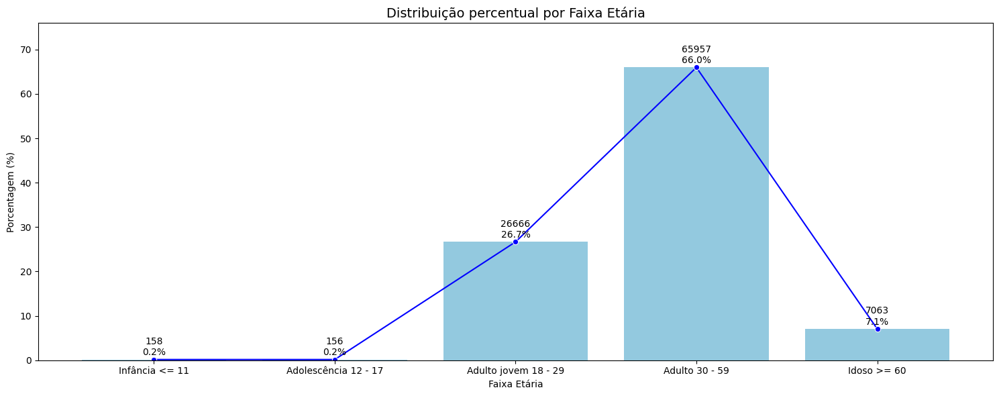

In [35]:
plot_distribuicao_faixa_etaria(dados_tesouro, 'Idade')

/tmp/ipykernel_2750534/963561094.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[coluna_foco] = df[coluna].apply(classificar_idade)


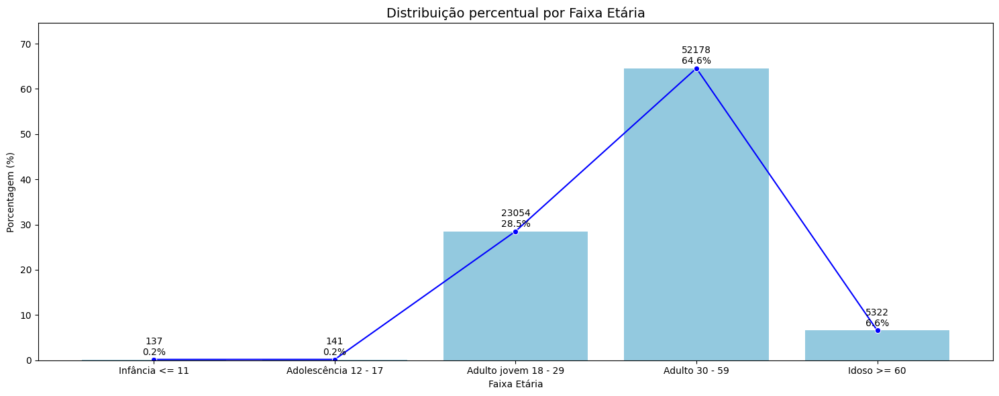

In [36]:
plot_distribuicao_faixa_etaria(dados_tesouro[dados_tesouro['Situacao da Conta']=='A'], 'Idade')

/tmp/ipykernel_2750534/963561094.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[coluna_foco] = df[coluna].apply(classificar_idade)


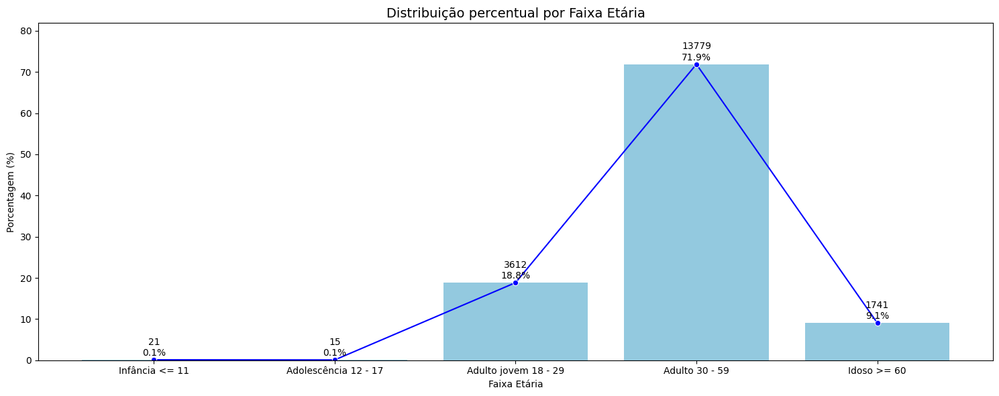

In [37]:
plot_distribuicao_faixa_etaria(dados_tesouro[dados_tesouro['Situacao da Conta']=='D'], 'Idade')

### 2.3 Qual o estado com o maior numeros de pessoas que investem em tesouro direto?

In [90]:
print(dados_tesouro[dados_tesouro['Situacao da Conta']=='D']['UF do Investidor'].value_counts().to_dict())

{'SP': 7076, 'RJ': 1904, 'MG': 1788, 'PR': 1177, 'RS': 940, 'SC': 854, 'BA': 696, 'GO': 591, 'DF': 581, 'PE': 520, 'CE': 468, 'ES': 377, 'MT': 274, 'PA': 273, 'MA': 221, 'MS': 205, 'PB': 201, 'AM': 192, 'RN': 183, 'SE': 129, 'AL': 121, 'PI': 121, 'RO': 92, 'TO': 68, 'AP': 44, 'RR': 40, 'AC': 32}


In [88]:
mostrar_distribuicao_por_estados(dados_tesouro[dados_tesouro['Situacao da Conta']=='A'])

Mapa salvo em: images/mapa_investidores.html


### 2.4 Qual a distribuição de genero no dataset?

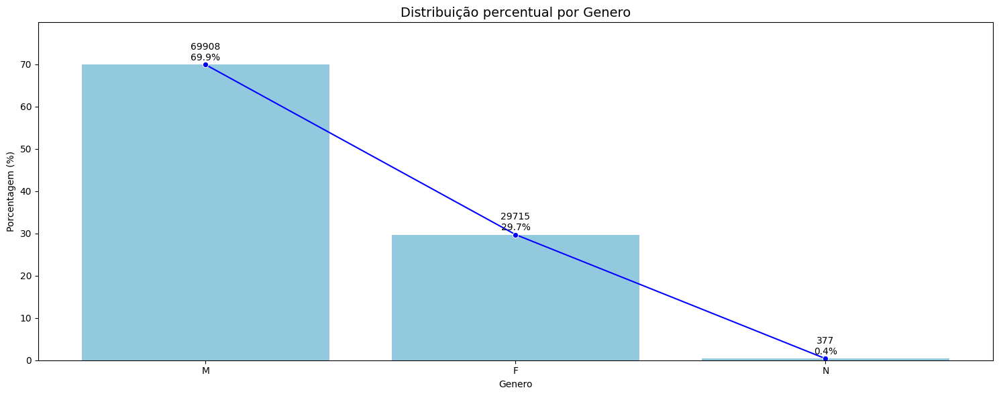

In [89]:
plot_distribuicao_faixa_etaria(dados_tesouro, 'Genero')

{'SP': 7076, 'RJ': 1904, 'MG': 1788, 'PR': 1177, 'RS': 940, 'SC': 854, 'BA': 696, 'GO': 591, 'DF': 581, 'PE': 520, 'CE': 468, 'ES': 377, 'MT': 274, 'PA': 273, 'MA': 221, 'MS': 205, 'PB': 201, 'AM': 192, 'RN': 183, 'SE': 129, 'AL': 121, 'PI': 121, 'RO': 92, 'TO': 68, 'AP': 44, 'RR': 40, 'AC': 32}


## 3.0 Agrupamento de investidores

### 3.1 Pré-processamento dos dados

### 3.1.0 Converter variaveis categoricas em numericas, usando One-Hot Encoding ou Label Enconding

In [95]:
# dados_tesouro_encoded = pd.get_dummies(dados_tesouro, columns=['Profissao', 'Estado Civil', 'Genero'], drop_first=True)
dados_tesouro_encoded = dados_tesouro.copy()
dados_tesouro_encoded = dados_tesouro_encoded.drop(columns=['Profissao', 'Estado Civil'])
dados_tesouro_encoded = pd.get_dummies(dados_tesouro_encoded, columns=['Genero'])
dados_tesouro_encoded = dados_tesouro_encoded.drop(columns=['Codigo do Investidor', 'Data de Adesao', 'UF do Investidor','Cidade do Investidor', 'Pais do Investidor', 'Faixa Etária'])

In [96]:
dados_tesouro_encoded

,Idade,Situacao da Conta,Operou 12 Meses,Genero_F,Genero_M,Genero_N
781974,28,A,N,False,True,False
937737,28,A,N,True,False,False
907828,35,D,N,True,False,False
784628,55,D,N,False,True,False
662460,24,A,N,False,True,False
...,...,...,...,...,...,...
80809,30,A,N,False,True,False
671949,25,A,N,False,True,False
499176,60,A,N,False,True,False
862817,21,A,N,False,True,False


### 3.1.1 Normalizar vaiveis numericas como Idade

In [97]:
dados_tesouro['Situacao da Conta'].unique()
dados_tesouro['Operou 12 Meses'].unique()

array(['N', 'S'], dtype=object)

In [98]:
scaler = MinMaxScaler()

dados_tesouro_encoded['Idade'] = scaler.fit_transform(dados_tesouro[['Idade']])
dados_tesouro_encoded = dados_tesouro_encoded.rename(columns={'Idade': 'Idade_normalizada'})

### 3.1.2 Converter "Operou 12 Meses" e "Situacao" da Conta para booleanos.

In [99]:
dados_tesouro_encoded['Operou 12 Meses'] = dados_tesouro['Operou 12 Meses'].map({'S': True, 'N': False})
dados_tesouro_encoded['Situacao da Conta'] = dados_tesouro['Situacao da Conta'].map({'A': True, 'D': False})

# dados_tesouro_encoded[['Situacao da Conta', 'Operou 12 Meses']] = dados_tesouro_encoded[['Situacao da Conta', 'Operou 12 Meses']].astype(float)

dados_tesouro_encoded = dados_tesouro_encoded.astype(float)


In [100]:
dados_tesouro_encoded

,Idade_normalizada,Situacao da Conta,Operou 12 Meses,Genero_F,Genero_M,Genero_N
781974,0.232759,1.0,0.0,0.0,1.0,0.0
937737,0.232759,1.0,0.0,1.0,0.0,0.0
907828,0.293103,0.0,0.0,1.0,0.0,0.0
784628,0.465517,0.0,0.0,0.0,1.0,0.0
662460,0.198276,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...
80809,0.250000,1.0,0.0,0.0,1.0,0.0
671949,0.206897,1.0,0.0,0.0,1.0,0.0
499176,0.508621,1.0,0.0,0.0,1.0,0.0
862817,0.172414,1.0,0.0,0.0,1.0,0.0


In [102]:
from sklearn.metrics import pairwise_distances

In [103]:
import psutil
process = psutil.Process()
print(f"Memória usada: {process.memory_info().rss / 1024 ** 2:.2f} MB")

mem = psutil.virtual_memory()
print(f"Memória total: {mem.total / 1024 ** 2:.2f} MB")
print(f"Memória disponível: {mem.available / 1024 ** 2:.2f} MB")
print(f"Uso de memória: {mem.percent:.2f}%")


Memória usada: 1165.94 MB
Memória total: 515788.58 MB
Memória disponível: 455699.22 MB
Uso de memória: 11.60%


### 3.2 Encontrando o K ideal utilizando silhouette_score e aprendizado não supervisionado

In [116]:
#import silhouette
import plotly.express as px
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

#Escolha do número de grupos (Avaliar diferentes valores K e escolher o de maior valor)
silhouette_values=[]
k_values=[]
best_silhouette = -1
best_k = None
best_labels = None
min_SS=2

for k in range(2, 20):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(dados_tesouro_encoded)
    #aplicar a silhueta
    silhouette_avg = silhouette_score(dados_tesouro_encoded, labels)
    print(f"Silhueta para K={k}: {silhouette_avg}")
    #Selecionar a melhor partição
    if silhouette_avg > best_silhouette:
        best_silhouette = silhouette_avg
        best_k = k
        best_labels = labels
    if silhouette_avg < min_SS:
      min_SS = silhouette_avg
    #Salvar os valores de silhueta para plotar com matplotlib
    silhouette_values.append(silhouette_avg)
    k_values.append(k)

#plot lines with plotly express
fig = px.line(x=k_values, y=silhouette_values, title='Silhouette Score para diferentes valores de K')
#plot horizontal line on best k
fig.add_shape(
    type='line',
    x0=best_k,
    y0=min_SS,
    x1=best_k,
    y1=1,
    line=dict(color='red', width=2, dash='dash'),
    name='Melhor K'
)
fig.show()


Silhueta para K=2: 0.754595581200306
Silhueta para K=3: 0.797917116689594
Silhueta para K=4: 0.7923965442608745
Silhueta para K=5: 0.8663055426246524
Silhueta para K=6: 0.8850010310241012
Silhueta para K=7: 0.8881656272929203
Silhueta para K=8: 0.7343084235342048
Silhueta para K=9: 0.7346393242943586
Silhueta para K=10: 0.6754472903729701
Silhueta para K=11: 0.6667704615795479
Silhueta para K=12: 0.6544718991922567
Silhueta para K=13: 0.645522955662705
Silhueta para K=14: 0.6468757254579729
Silhueta para K=15: 0.636668439751318
Silhueta para K=16: 0.5985491227890403
Silhueta para K=17: 0.5896462536389373
Silhueta para K=18: 0.5887745184678674
Silhueta para K=19: 0.5815451045289364


##### MELHOR VALOR PARA K ENCONTRADO: 7

### 3.2.1 Tecnicas de clusterizacao

In [105]:
# Calcula a matriz de distância de Hamming
matriz_dist_hamming = pairwise_distances(dados_tesouro_encoded, metric='hamming')

print(matriz_dist_hamming)

[[0.         0.33333333 0.66666667 ... 0.16666667 0.16666667 0.16666667]
 [0.33333333 0.         0.33333333 ... 0.5        0.5        0.5       ]
 [0.66666667 0.33333333 0.         ... 0.66666667 0.66666667 0.66666667]
 ...
 [0.16666667 0.5        0.66666667 ... 0.         0.16666667 0.16666667]
 [0.16666667 0.5        0.66666667 ... 0.16666667 0.         0.16666667]
 [0.16666667 0.5        0.66666667 ... 0.16666667 0.16666667 0.        ]]


### 3.3 Agrupamento Hierarquico

In [118]:
# import seaborn as sns
# import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering

# # 3. Plotar heatmap
# sns.heatmap(matriz_dist_hamming, annot=True, cmap='viridis', xticklabels=df_features.index, yticklabels=df_features.index)
# plt.title('Matriz de Distância (Hamming)')
# plt.xlabel('Cliente')
# plt.ylabel('Cliente')
# plt.show()

# 4. Clustering (ex: Agglomerative Clustering com 7 grupos)
clustering = AgglomerativeClustering(n_clusters=7, metric='precomputed', linkage='average')
labels = clustering.fit_predict(matriz_dist_hamming)

In [119]:
# Mostrar os grupos
dados_tesouro_encoded['Cluster'] = labels

#### 3.3.1 Redução de Dimensionalidade (com PCA ou t-SNE)

In [120]:
from sklearn.decomposition import PCA
import plotly.express as px

features = list(dados_tesouro_encoded.columns)
pca = PCA(n_components=3)
dados_pca = pca.fit_transform(dados_tesouro_encoded[features].values)

# Criar um novo DataFrame com os componentes
df_pca = pd.DataFrame(dados_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['Clusters'] = dados_tesouro_encoded['Cluster'].values
# Plotar com Plotly Express
fig = px.scatter_3d(df_pca,
                    x='PC1', y='PC2', z='PC3',
                    color='Clusters',
                    title='Visualização PCA 3D dos Dados tesouro direto (Padronizados)',
                    labels={'PC1': 'Componente Principal 1',
                            'PC2': 'Componente Principal 2',
                            'PC3': 'Componente Principal 3'})
fig.show()


#### 3.3.2 Usar t-SNE para representação mais precisa (mais lento, mas melhor visual)

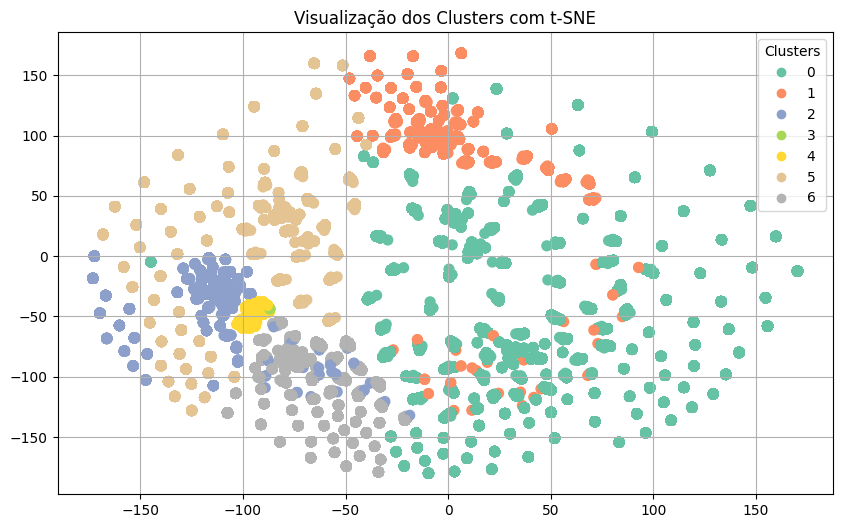

In [122]:
from sklearn.manifold import TSNE

# Reduz com t-SNE para visualização
tsne = TSNE(n_components=2, metric='hamming', perplexity=30, random_state=42)
df_tsne = tsne.fit_transform(dados_tesouro_encoded.drop('Cluster', axis=1))

# Plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=dados_tesouro_encoded['Cluster'], cmap='Set2', s=50)
plt.title('Visualização dos Clusters com t-SNE')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.grid(True)
plt.show()


### 3.4 Clusterização KMEANS (Unsupervised Learning)

In [128]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

NUMBER_CLUSTERS = 7

In [129]:
test = dados_tesouro_encoded.drop('Cluster', axis=1)

# normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(test)

# clusterização
kmeans = KMeans(n_clusters=NUMBER_CLUSTERS, random_state=42)
test['cluster'] = kmeans.fit_predict(X_scaled)

In [132]:
from sklearn.decomposition import PCA
import plotly.express as px

features = list(test.columns)
pca = PCA(n_components=3)
dados_pca = pca.fit_transform(test[features].values)

# Criar um novo DataFrame com os componentes
df_pca = pd.DataFrame(dados_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['Clusters'] = test['cluster'].values
# Plotar com Plotly Express
fig = px.scatter_3d(df_pca,
                    x='PC1', y='PC2', z='PC3',
                    color='Clusters',
                    title='Visualização PCA 3D dos Dados tesouro direto (Padronizados) - KMEANS',
                    labels={'PC1': 'Componente Principal 1',
                            'PC2': 'Componente Principal 2',
                            'PC3': 'Componente Principal 3'})
fig.show()


#### 3.4.2 Usar t-SNE para representação mais precisa (mais lento, mas melhor visual)

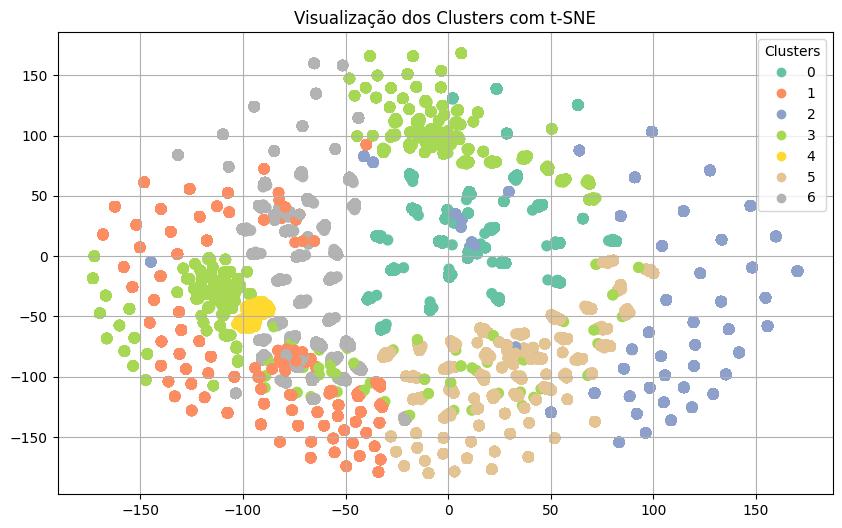

In [134]:
from sklearn.manifold import TSNE

# Reduz com t-SNE para visualização
tsne = TSNE(n_components=2, metric='hamming', perplexity=30, random_state=42)
df_tsne = tsne.fit_transform(test.drop('cluster', axis=1))

# Plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=test['cluster'], cmap='Set2', s=50)
plt.title('Visualização dos Clusters com t-SNE')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.grid(True)
plt.show()


In [125]:
# análise
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

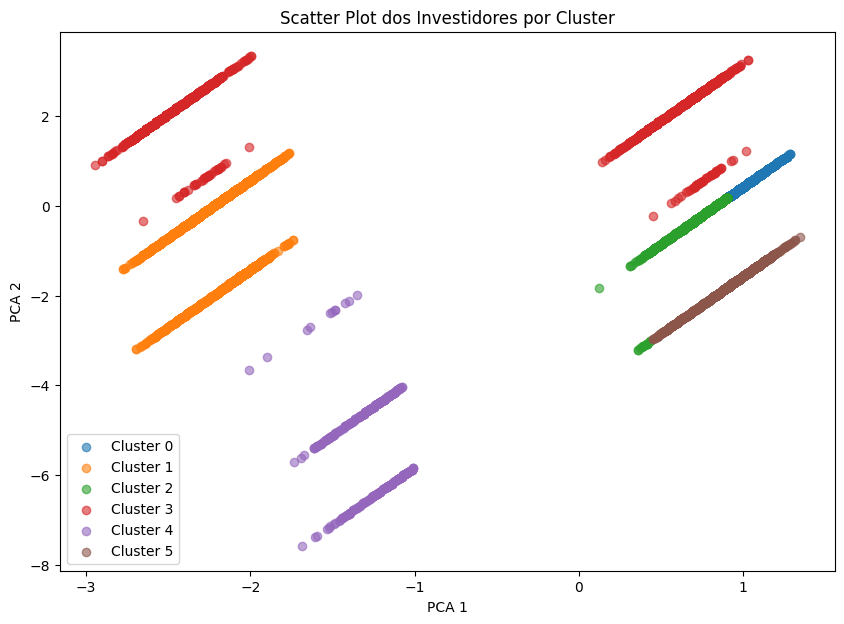

In [129]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))

# Plotando cada cluster com uma cor diferente
for cluster in range(kmeans.n_clusters):
    plt.scatter(
        X_pca[test['cluster'] == cluster, 0],
        X_pca[test['cluster'] == cluster, 1],
        label=f'Cluster {cluster}',
        alpha=0.6
    )

plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('Scatter Plot dos Investidores por Cluster')
plt.legend()
plt.show()


### 3.5 Clusterização utilizando MiniBatchKMeans e DBSCAN

In [135]:
from sklearn.cluster import MiniBatchKMeans
import pandas as pd

# Passo 1: Converter os dados booleanos para float
df_prepared = dados_tesouro_encoded.astype(float)

# Passo 2: Aplicar MiniBatchKMeans
kmeans = MiniBatchKMeans(n_clusters=7, batch_size=100000, random_state=42)
labels = kmeans.fit_predict(df_prepared)

# Passo 3: Adicionar os rótulos de cluster ao DataFrame
df_prepared['Cluster'] = labels

# Exibir os primeiros resultados
print(df_prepared['Cluster'].value_counts())


Cluster
6    29190
0    22586
1    22411
3    13730
4     5202
2     4402
5     2479
Name: count, dtype: int64


In [136]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Amostragem para evitar estouro de memória
df_amostra = dados_tesouro_encoded

# Escalonamento (DBSCAN se beneficia disso)
df_scaled = StandardScaler().fit_transform(df_amostra)

# Aplicar DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)
labels = dbscan.fit_predict(df_scaled)

# Adiciona os rótulos
df_amostra['Cluster'] = labels

# Mostra distribuição
print(df_amostra['Cluster'].value_counts())


Cluster
 0    51775
 1    22044
 3    13730
 2     5202
 4     4362
 5     2435
 7      204
 6      160
 9       37
 8       32
-1       19
Name: count, dtype: int64


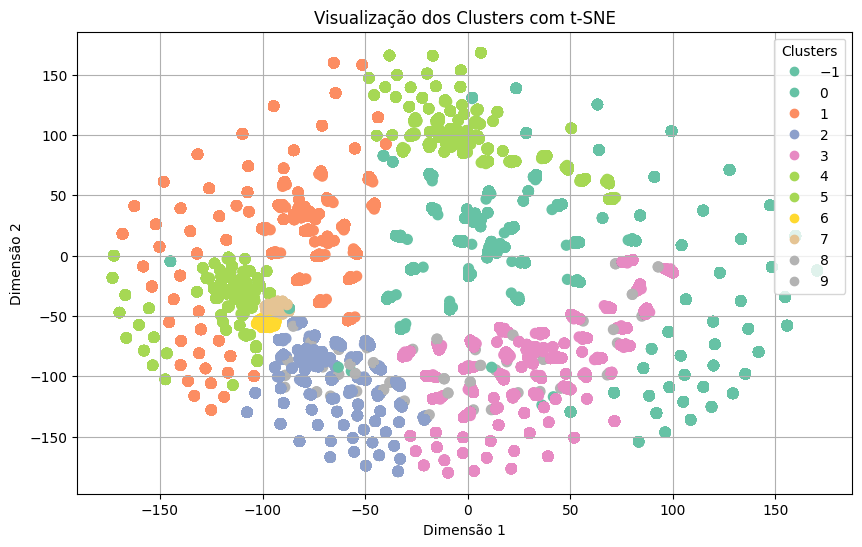

In [137]:
from sklearn.manifold import TSNE

# Reduz com t-SNE para visualização
tsne = TSNE(n_components=2, metric='hamming', perplexity=30, random_state=42)
df_tsne = tsne.fit_transform(df_amostra.drop('Cluster', axis=1))

# Plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=df_amostra['Cluster'], cmap='Set2', s=50)
plt.title('Visualização dos Clusters com t-SNE')
plt.xlabel('Dimensão 1')
plt.ylabel('Dimensão 2')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.grid(True)
plt.show()